シミュレーション実験を行うファイル

# モジュールインポート

In [2]:
%pip install scikit-learn

  Using cached scikit_learn-1.4.1.post1-cp312-cp312-win_amd64.whl.metadata (11 kB)
  Using cached scipy-1.12.0-cp312-cp312-win_amd64.whl.metadata (60 kB)
  Using cached joblib-1.3.2-py3-none-any.whl.metadata (5.4 kB)
Using cached scikit_learn-1.4.1.post1-cp312-cp312-win_amd64.whl (10.6 MB)
Using cached joblib-1.3.2-py3-none-any.whl (302 kB)
Using cached scipy-1.12.0-cp312-cp312-win_amd64.whl (45.8 MB)
Note: you may need to restart the kernel to use updated packages.


In [1]:
%pip install scipy

Note: you may need to restart the kernel to use updated packages.


In [1]:
import numpy as np
import pandas as pd
from make_artificialdata import make_data_3dims
from simulator_regret import simulator_regret
from mabs import TreeBootstrap, TreeUCB, EpsGreedy, LogisticUCB, ThompsonSampling
import matplotlib.pyplot as plt

# 人工データ作成

In [2]:
"""
contexts: n_dims次元のdataframe文脈データ
n_actions: 行動の種類数
n_dims: 文脈の次元数(contextの列数)
"""
df, n_actions, n_dims, isArtificial = make_data_3dims()

In [3]:
display(df)
print(n_actions)
print(n_dims)
print(isArtificial)

,Age,edu_background,strength
0,6,0,0
1,3,3,5
2,7,2,4
3,4,3,2
4,6,3,6
...,...,...,...
995,9,2,2
996,9,3,3
997,7,1,5
998,1,0,4


3
3
True


# UCIデータ読み込み，前処理

## CoverType

In [6]:
# ここで読み込み，前処理
!pip install ucimlrepo

Could not fetch URL https://pypi.org/simple/ucimlrepo/: There was a problem confirming the ssl certificate: HTTPSConnectionPool(host='pypi.org', port=443): Max retries exceeded with url: /simple/ucimlrepo/ (Caused by SSLError("Can't connect to HTTPS URL because the SSL module is not available.")) - skipping
Could not fetch URL https://pypi.org/simple/pip/: There was a problem confirming the ssl certificate: HTTPSConnectionPool(host='pypi.org', port=443): Max retries exceeded with url: /simple/pip/ (Caused by SSLError("Can't connect to HTTPS URL because the SSL module is not available.")) - skipping


ERROR: Could not find a version that satisfies the requirement ucimlrepo (from versions: none)
ERROR: No matching distribution found for ucimlrepo


In [7]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
covertype = fetch_ucirepo(id=31)

# data (as pandas dataframes)
X = covertype.data.features
y = covertype.data.targets  # 公式のコードにはこれでターゲット値が手に入るとあったが，実際の目標変数はXの最後の列の中に入っているぽい

# metadata
print(covertype.metadata)

# variable information
print(covertype.variables)


{'uci_id': 31, 'name': 'Covertype', 'repository_url': 'https://archive.ics.uci.edu/dataset/31/covertype', 'data_url': 'https://archive.ics.uci.edu/static/public/31/data.csv', 'abstract': 'Classification of pixels into 7 forest cover types based on attributes such as elevation, aspect, slope, hillshade, soil-type, and more.', 'area': 'Biology', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 581012, 'num_features': 52, 'feature_types': ['Categorical', 'Integer'], 'demographics': [], 'target_col': None, 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1998, 'last_updated': 'Fri Oct 27 2023', 'dataset_doi': '10.24432/C50K5N', 'creators': ['Jock Blackard'], 'intro_paper': None, 'additional_info': {'summary': 'Predicting forest cover type from cartographic variables only (no remotely sensed data).  The actual forest cover type for a given observation (30 x 30 meter cell) was determined from US Forest

# シミュレーション準備

# 人工データでシミュレーション

## ε-greedy

In [3]:
# クラスのインスタンス定義
eg = EpsGreedy(n_actions, 0.05)
# 報酬リスト取得[1, 0, 1, 1, ...]
eg_reward_list = simulator_regret(df, eg, isArtificial)
# 累積和の計算
eg_cumulative_reward_list = np.cumsum(eg_reward_list)
# インデックスiにおける値の平均を計算してリストに格納
eg_average_reward_list = [np.mean(eg_reward_list[:i+1]) for i in range(len(eg_reward_list))]

c:\Users\oiwal\OneDrive\ドキュメント\Tree-Bandit-Implemention-master\Tree-Bandit-Implemention-master\simulator_regret.py:84: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if context[0] >= threshold[0][action]:
c:\Users\oiwal\OneDrive\ドキュメント\Tree-Bandit-Implemention-master\Tree-Bandit-Implemention-master\simulator_regret.py:85: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if context[1] >= threshold[1][action]:
c:\Users\oiwal\OneDrive\ドキュメント\Tree-Bandit-Implemention-master\Tree-Bandit-Implemention-master\simulator_regret.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, 

In [5]:
perform_list = []
rep_num = 10
for i in range(rep_num):
    # クラスのインスタンス定義
    eg = EpsGreedy(n_actions, 0.05)
    # 報酬リスト取得[1, 0, 1, 1, ...]
    eg_reward_list = simulator(df, eg, isArtificial)
    # 性能
    perform = sum(eg_reward_list) / len(eg_reward_list)
    # 記録
    perform_list.append(perform)

# 手法が母比率(母性能?)pを持つと仮定し，点推定と95%区間推定
z_a = 1.96
point_estimate = sum(perform_list) / rep_num
half_of_interval = z_a*np.sqrt((point_estimate*(1-point_estimate))/rep_num)
interval_estimate = [point_estimate-half_of_interval, point_estimate+half_of_interval]

print(f"ε-greedy 平均報酬点推定値：{point_estimate}")
print(f"ε-greedy 平均報酬区間推定値：{interval_estimate}")

ε-greedy 平均報酬点推定値：0.4657
ε-greedy 平均報酬区間推定値：[0.15652684527663147, 0.7748731547233685]


## Thompson Sampling

In [4]:
# クラスのインスタンス定義
ts = ThompsonSampling(n_actions)
# 報酬リスト取得[1, 0, 1, 1, ...]
ts_reward_list = simulator_regret(df, ts, isArtificial)
# 累積和の計算
ts_cumulative_reward_list = np.cumsum(ts_reward_list)
# インデックスiにおける値の平均を計算してリストに格納
ts_average_reward_list = [np.mean(ts_reward_list[:i+1]) for i in range(len(ts_reward_list))]

## TreeBootstrap

In [5]:
# クラスのインスタンス定義
tb = TreeBootstrap(n_actions, n_dims)
# 報酬リスト取得[1, 0, 1, 1, ...]
tb_reward_list = simulator_regret(df, tb, isArtificial)
# 累積和の計算
tb_cumulative_reward_list = np.cumsum(tb_reward_list)
# インデックスiにおける値の平均を計算してリストに格納
tb_average_reward_list = [np.mean(tb_reward_list[:i+1]) for i in range(len(tb_reward_list))]

c:\Users\oiwal\OneDrive\ドキュメント\Tree-Bandit-Implemention-master\Tree-Bandit-Implemention-master\simulator_regret.py:84: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if context[0] >= threshold[0][action]:
c:\Users\oiwal\OneDrive\ドキュメント\Tree-Bandit-Implemention-master\Tree-Bandit-Implemention-master\simulator_regret.py:90: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if context[2] >= threshold[2][action]:
c:\Users\oiwal\OneDrive\ドキュメント\Tree-Bandit-Implemention-master\Tree-Bandit-Implemention-master\simulator_regret.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, 

In [5]:
perform_list = []
rep_num = 10
name = "TreeBootstrap"

for i in range(rep_num):
    # クラスのインスタンス定義
    mab = TreeBootstrap(n_actions, n_dims)
    # 報酬リスト取得[1, 0, 1, 1, ...]
    reward_list = simulator_regret(df, mab, isArtificial)
    # 性能
    perform = sum(reward_list) / len(reward_list)
    # 記録
    perform_list.append(perform)

# 手法が母比率(母性能?)pを持つと仮定し，点推定と95%区間推定
z_a = 1.96
point_estimate = sum(perform_list) / rep_num
half_of_interval = z_a*np.sqrt((point_estimate*(1-point_estimate))/rep_num)
interval_estimate = [point_estimate-half_of_interval, point_estimate+half_of_interval]

print(f"{name} 平均報酬点推定値：{point_estimate}")
print(f"{name} 平均報酬区間推定値：{interval_estimate}")

c:\Users\oiwal\OneDrive\ドキュメント\Tree-Bandit-Implemention-master\Tree-Bandit-Implemention-master\simulator_regret.py:84: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if context[0] >= threshold[0][action]:
c:\Users\oiwal\OneDrive\ドキュメント\Tree-Bandit-Implemention-master\Tree-Bandit-Implemention-master\simulator_regret.py:90: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if context[2] >= threshold[2][action]:
c:\Users\oiwal\OneDrive\ドキュメント\Tree-Bandit-Implemention-master\Tree-Bandit-Implemention-master\simulator_regret.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, 

KeyboardInterrupt: 

## TreeUCB

In [6]:
# クラスのインスタンス定義
tbucb = TreeUCB(n_actions, n_dims)
# 報酬リスト取得[1, 0, 1, 1, ...]
tbucb_reward_list = simulator_regret(df, tbucb, isArtificial)
# 累積和の計算
tbucb_cumulative_reward_list = np.cumsum(tbucb_reward_list)
# インデックスiにおける値の平均を計算してリストに格納
tbucb_average_reward_list = [np.mean(tbucb_reward_list[:i+1]) for i in range(len(tbucb_reward_list))]

c:\Users\oiwal\OneDrive\ドキュメント\Tree-Bandit-Implemention-master\Tree-Bandit-Implemention-master\simulator_regret.py:84: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if context[0] >= threshold[0][action]:
c:\Users\oiwal\OneDrive\ドキュメント\Tree-Bandit-Implemention-master\Tree-Bandit-Implemention-master\simulator_regret.py:90: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if context[2] >= threshold[2][action]:
c:\Users\oiwal\OneDrive\ドキュメント\Tree-Bandit-Implemention-master\Tree-Bandit-Implemention-master\simulator_regret.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, 

In [17]:
perform_list = []
rep_num = 10
name = "TreeUCB"

for i in range(rep_num):
    # クラスのインスタンス定義
    mab = TreeUCB(n_actions, n_dims)
    # 報酬リスト取得[1, 0, 1, 1, ...]
    reward_list = simulator(df, mab, isArtificial)
    # 性能
    perform = sum(reward_list) / len(reward_list)
    # 記録
    perform_list.append(perform)

# 手法が母比率(母性能?)pを持つと仮定し，点推定と95%区間推定
z_a = 1.96
point_estimate = sum(perform_list) / rep_num
half_of_interval = z_a*np.sqrt((point_estimate*(1-point_estimate))/rep_num)
interval_estimate = [point_estimate-half_of_interval, point_estimate+half_of_interval]

print(f"{name} 平均報酬点推定値：{point_estimate}")
print(f"{name} 平均報酬区間推定値：{interval_estimate}")

c:\Users\hjhhd\Desktop\multi-armed-bandits-for-recommendation-systems-main\multi-armed-bandits-for-recommendation-systems-main\JSAI_simulate\simulator.py:62: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if context[0] >= threshold[0][action]:
c:\Users\hjhhd\Desktop\multi-armed-bandits-for-recommendation-systems-main\multi-armed-bandits-for-recommendation-systems-main\JSAI_simulate\simulator.py:68: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if context[2] >= threshold[2][action]:
c:\Users\hjhhd\Desktop\multi-armed-bandits-for-recommendation-systems-main\multi-armed-bandits-for-recommendation-systems-main\JSAI_simula

TreeUCB 平均報酬点推定値：0.5836
TreeUCB 平均報酬区間推定値：[0.27805929710364286, 0.8891407028963572]


c:\Users\hjhhd\Desktop\multi-armed-bandits-for-recommendation-systems-main\multi-armed-bandits-for-recommendation-systems-main\JSAI_simulate\simulator.py:62: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if context[0] >= threshold[0][action]:
c:\Users\hjhhd\Desktop\multi-armed-bandits-for-recommendation-systems-main\multi-armed-bandits-for-recommendation-systems-main\JSAI_simulate\simulator.py:68: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if context[2] >= threshold[2][action]:
c:\Users\hjhhd\Desktop\multi-armed-bandits-for-recommendation-systems-main\multi-armed-bandits-for-recommendation-systems-main\JSAI_simula

## LogisticUCB

In [1]:
import numpy as np
import pandas as pd
from make_artificialdata import make_data_3dims
from simulator import simulator
from mabs import TreeBootstrap, TreeUCB, EpsGreedy, LogisticUCB
import matplotlib.pyplot as plt

"""
contexts: n_dims次元のdataframe文脈データ
n_actions: 行動の種類数
n_dims: 文脈の次元数(contextの列数)
"""
df, n_actions, n_dims, isArtificial = make_data_3dims()

In [2]:
# クラスのインスタンス定義
logi_ucb = LogisticUCB(n_actions, n_dims, 0.05, 1000)
# 報酬リスト取得[1, 0, 1, 1, ...]
logi_reward_list = simulator(df, logi_ucb, isArtificial)
# 累積和の計算
logi_cumulative_reward_list = np.cumsum(logi_reward_list)
# インデックスiにおける値の平均を計算してリストに格納
logi_average_reward_list = [np.mean(logi_reward_list[:i+1]) for i in range(len(logi_reward_list))]

c:\Users\oiwal\OneDrive\ドキュメント\Tree-Bandit-Implemention-master\Tree-Bandit-Implemention-master\simulator.py:62: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if context[0] >= threshold[0][action]:
c:\Users\oiwal\OneDrive\ドキュメント\Tree-Bandit-Implemention-master\Tree-Bandit-Implemention-master\simulator.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if context[1] >= threshold[1][action]:
c:\Users\oiwal\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\optimize\_nonlin.py:913: RuntimeWarning: divide by zero encountered in divide
  d = v / vdot(df, v)
c:\Users\oiwal\AppData\Local\Programs\Python\Python

# 実験結果

グラフ可視化

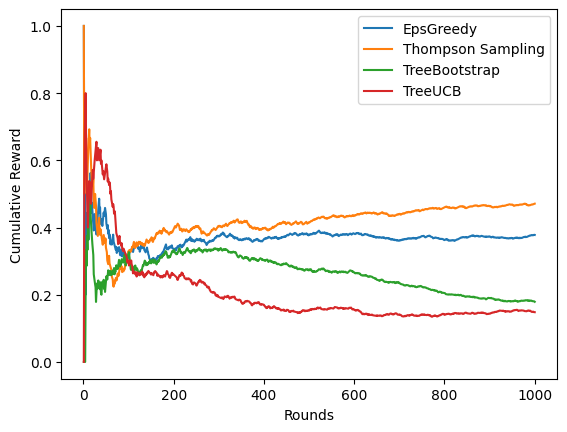

In [7]:
round_list = list(range(1, len(tb_reward_list)+1))
plt.plot(round_list, eg_average_reward_list, label = "EpsGreedy")
plt.plot(round_list, ts_average_reward_list, label = "Thompson Sampling")
# plt.plot(round_list, logi_average_reward_list, label = "LogisticUCB")
plt.plot(round_list, tb_average_reward_list, label = "TreeBootstrap")
plt.plot(round_list, tbucb_average_reward_list, label = "TreeUCB")

plt.ylabel('Cumulative Reward')
plt.xlabel('Rounds')
plt.legend()
plt.show()

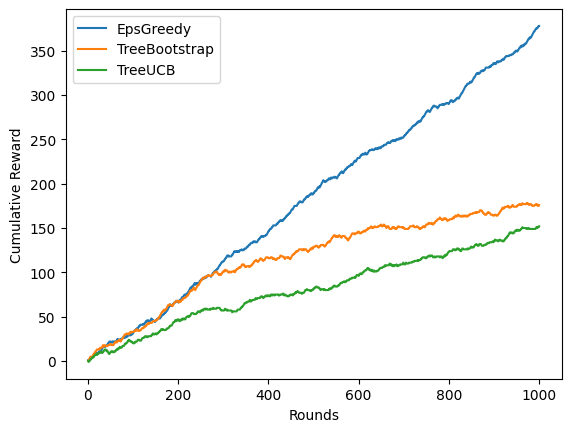

In [9]:
round_list = list(range(1, len(tb_reward_list)+1))
plt.plot(round_list, eg_cumulative_reward_list, label = "EpsGreedy")
# plt.plot(round_list, logi_cumulative_reward_list, label = "LogisticUCB")
plt.plot(round_list, tb_cumulative_reward_list, label = "TreeBootstrap")
plt.plot(round_list, tbucb_cumulative_reward_list, label = "TreeUCB")

plt.ylabel('Cumulative Reward')
plt.xlabel('Rounds')
plt.legend()
plt.show()